In [1]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd 
import math
import itertools
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import mean_absolute_error
from sklearn.externals.six import StringIO
import pydot
from IPython.display import Image
%matplotlib inline
import warnings #had to supress future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

D:\Anaconda\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


ModuleNotFoundError: No module named 'pydot'

In [2]:
adm = pd.read_csv(r'C:\Users\MHI6\Guido\Datasets\Admission_Predict_Ver1.1.csv') 
adm.describe()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000,500.00000
mean,250.500000,316.472000,107.192000,3.114000,3.374000,3.48400,8.576440,0.560000,0.72174
std,144.481833,11.295148,6.081868,1.143512,0.991004,0.92545,0.604813,0.496884,0.14114
min,1.000000,290.000000,92.000000,1.000000,1.000000,1.00000,6.800000,0.000000,0.34000
25%,125.750000,308.000000,103.000000,2.000000,2.500000,3.00000,8.127500,0.000000,0.63000
50%,250.500000,317.000000,107.000000,3.000000,3.500000,3.50000,8.560000,1.000000,0.72000
75%,375.250000,325.000000,112.000000,4.000000,4.000000,4.00000,9.040000,1.000000,0.82000
max,500.000000,340.000000,120.000000,5.000000,5.000000,5.00000,9.920000,1.000000,0.97000


In [3]:
X = adm.iloc[:, 1:8].values
y = adm.iloc[:, 8].values

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0DDD3930>,
      dtype=object)

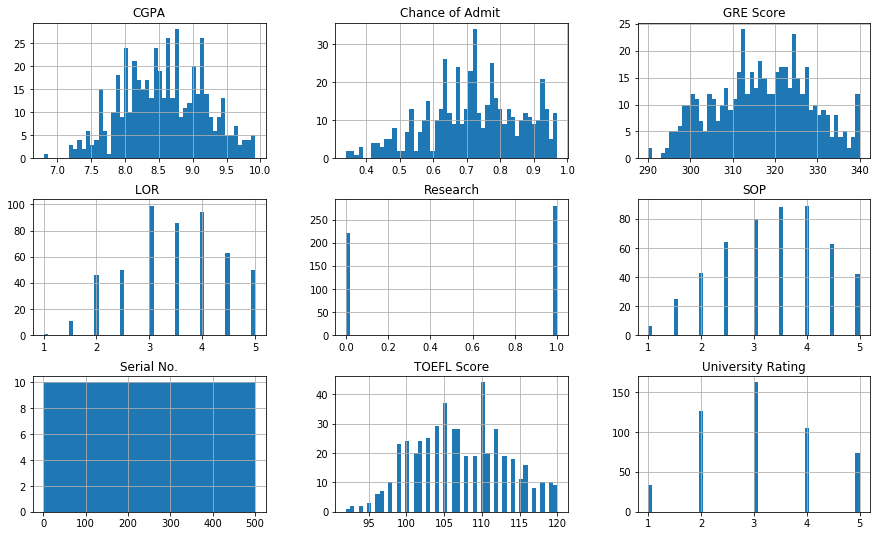

In [4]:
adm.hist(figsize=(15,9),bins=50)

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [6]:
rft = RandomForestRegressor()
rft.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [7]:
y_pred = rft.predict(X_test)

In [8]:
mean_absolute_error(y_test, y_pred) #error with one decision tree

0.049673333333333326

In [9]:
(np.abs(y_test - y_pred)/(y_test)).mean() #error with random forest

0.07940735256505903

In [10]:
rft.estimators_ #access to trees of the random forest

[DecisionTreeRegressor(criterion='mse', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort=False, random_state=1465970467, splitter='best'),
 DecisionTreeRegressor(criterion='mse', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       presort=False, random_state=233995945, splitter='best'),
 DecisionTreeRegressor(criterion='mse', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2,

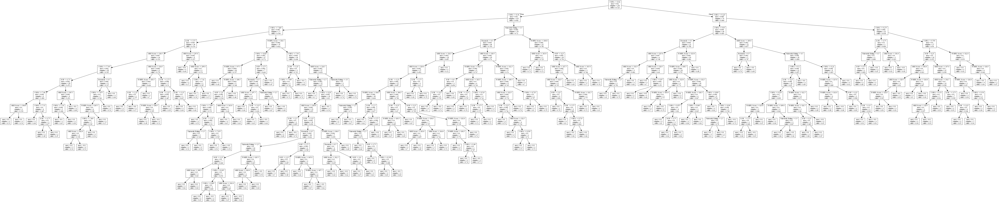

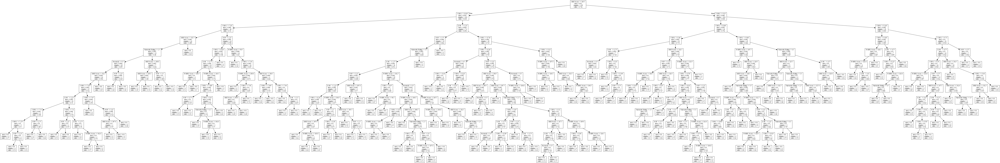

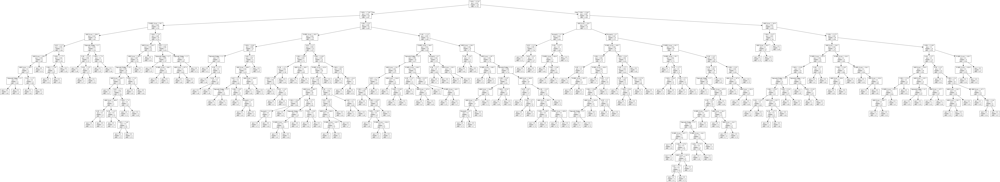

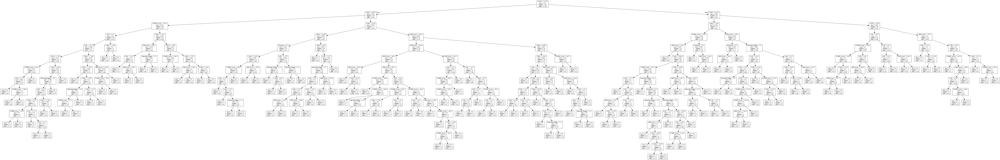

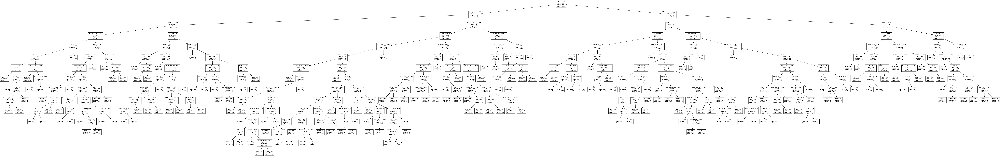

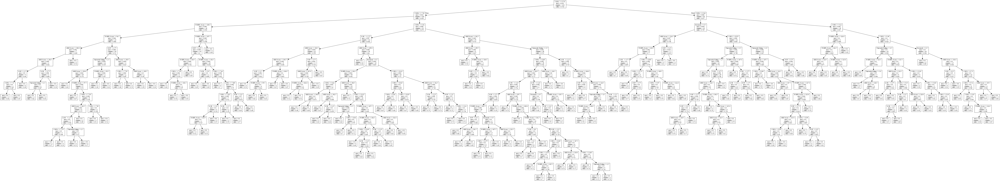

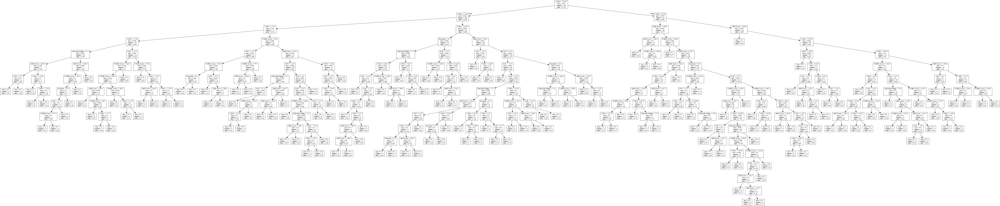

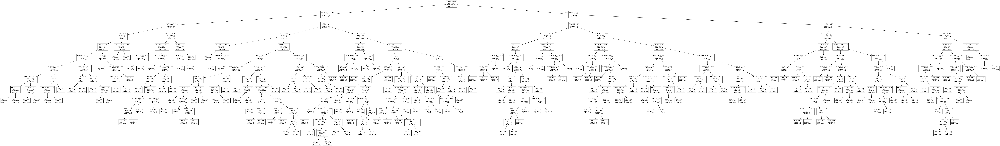

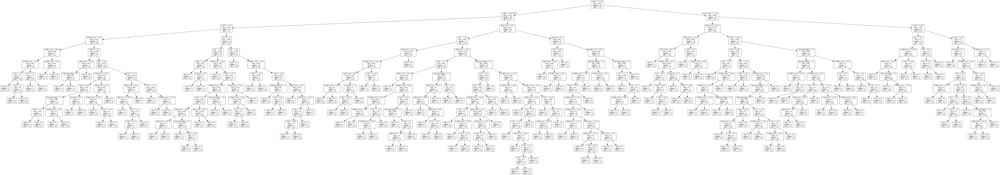

In [11]:
#all the trees of Random Forest
for i in range (0,9):
    dot_uni = StringIO()
    tree.export_graphviz(rft.estimators_[i], out_file = dot_uni, feature_names = adm.columns.values[1:8])
    (graph,) = pydot.graph_from_dot_data(dot_uni.getvalue())
    img = Image(graph.create_png())
    display(img)

In [12]:
#array of importances of the attributes
rft.feature_importances_

array([0.11067352, 0.03755564, 0.0125767 , 0.02357941, 0.01848026,
       0.7840063 , 0.01312817])

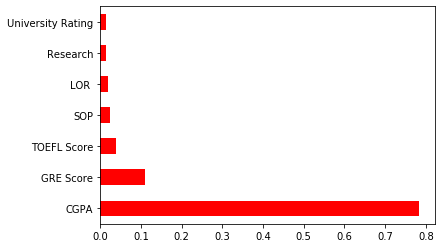

In [13]:
#plot of importances of attributes
pd.Series(rft.feature_importances_, index=adm.columns.values[1:8]).nlargest(8).plot(color='red', kind='barh')

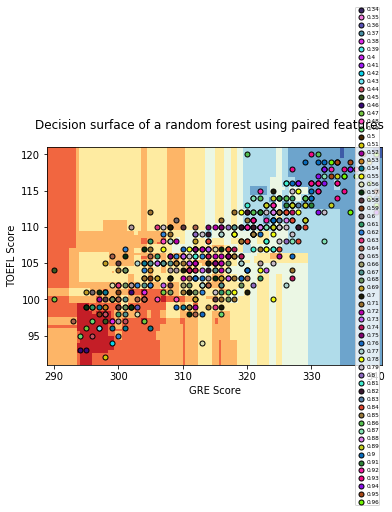

<Figure size 2160x1440 with 0 Axes>

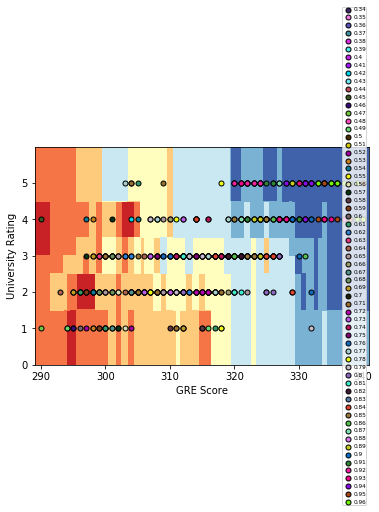

<Figure size 2160x1440 with 0 Axes>

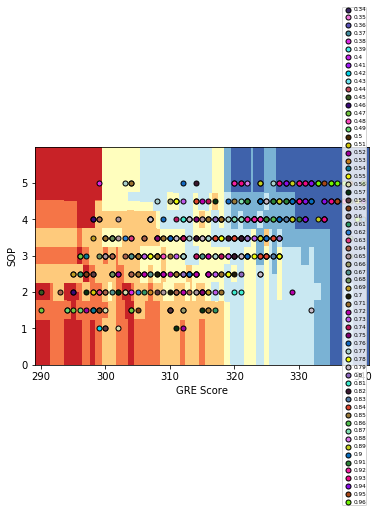

<Figure size 2160x1440 with 0 Axes>

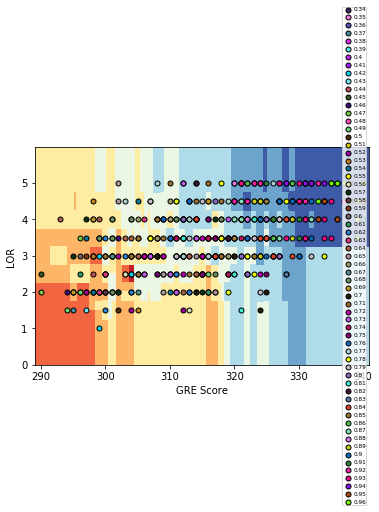

<Figure size 2160x1440 with 0 Axes>

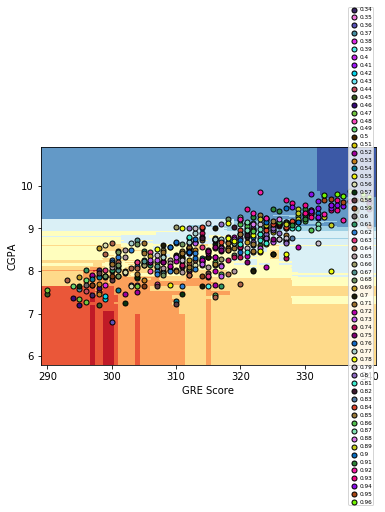

<Figure size 2160x1440 with 0 Axes>

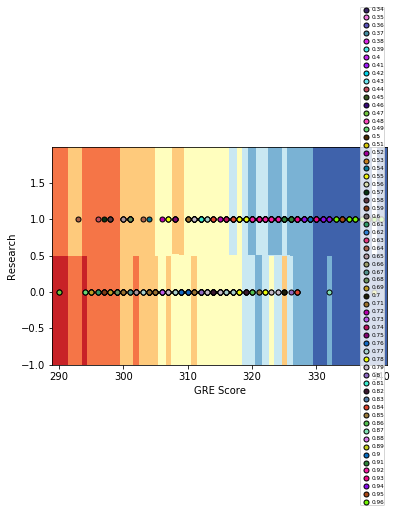

<Figure size 2160x1440 with 0 Axes>

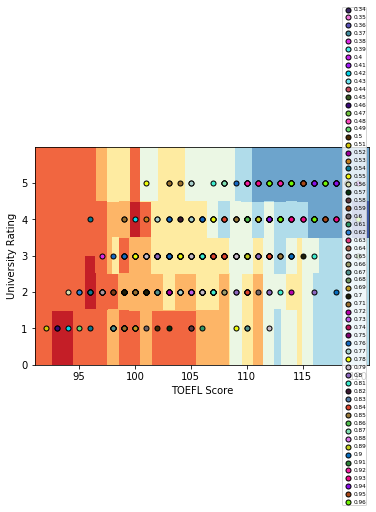

<Figure size 2160x1440 with 0 Axes>

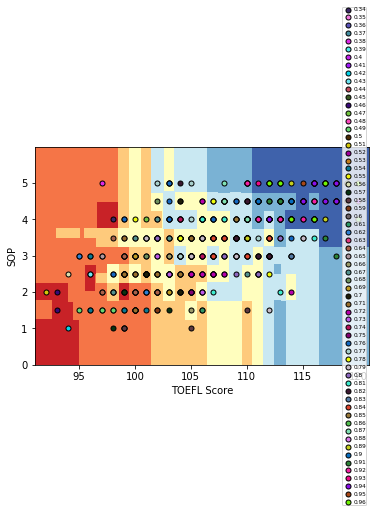

<Figure size 2160x1440 with 0 Axes>

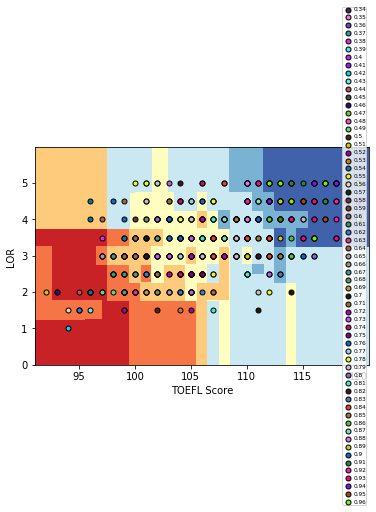

<Figure size 2160x1440 with 0 Axes>

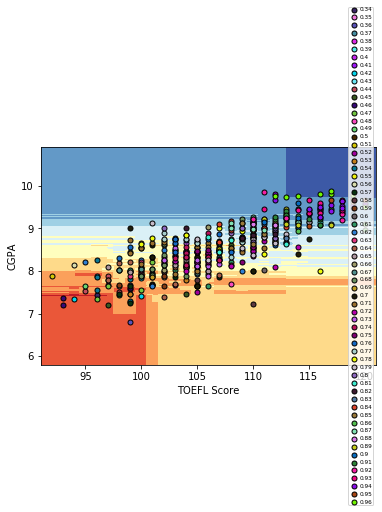

<Figure size 2160x1440 with 0 Axes>

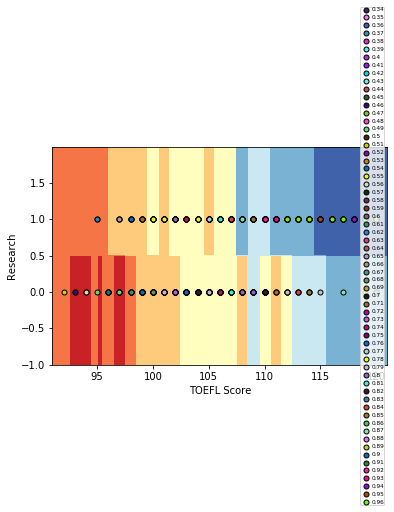

<Figure size 2160x1440 with 0 Axes>

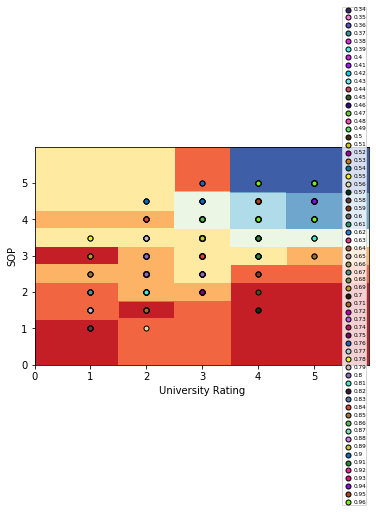

<Figure size 2160x1440 with 0 Axes>

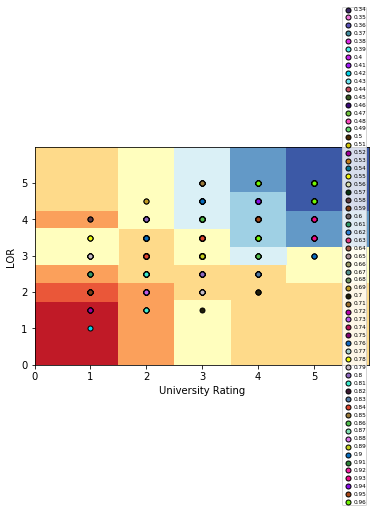

<Figure size 2160x1440 with 0 Axes>

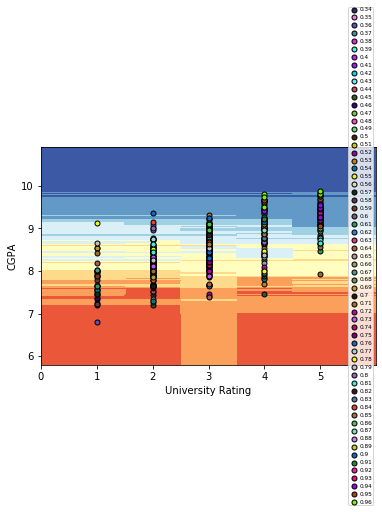

<Figure size 2160x1440 with 0 Axes>

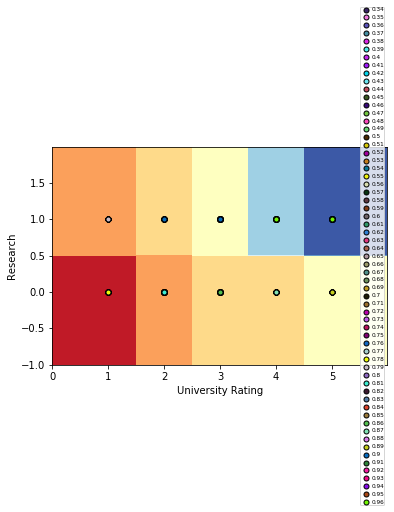

<Figure size 2160x1440 with 0 Axes>

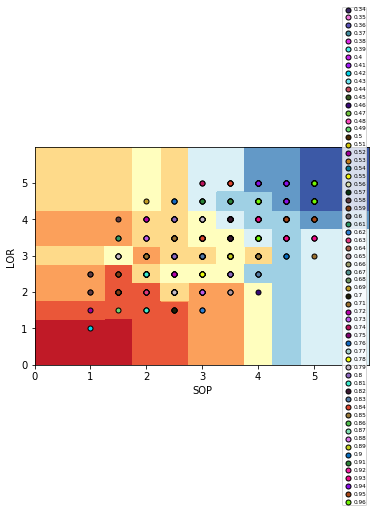

<Figure size 2160x1440 with 0 Axes>

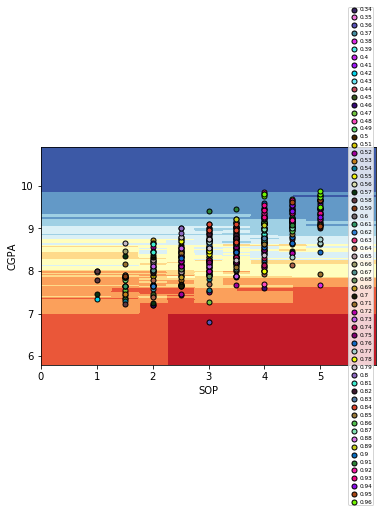

<Figure size 2160x1440 with 0 Axes>

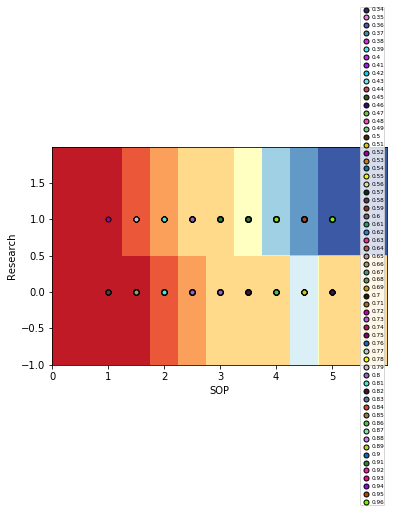

<Figure size 2160x1440 with 0 Axes>

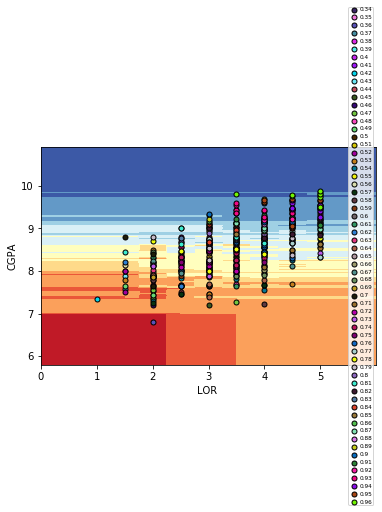

<Figure size 2160x1440 with 0 Axes>

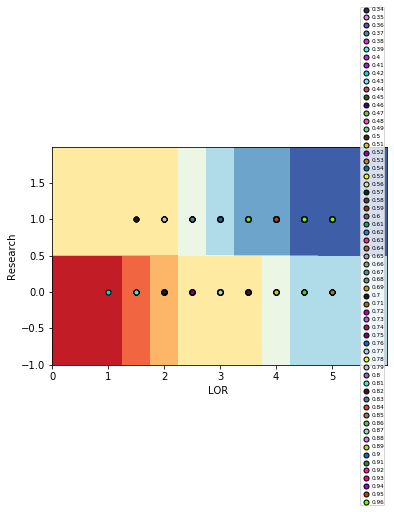

<Figure size 2160x1440 with 0 Axes>

In [11]:
#DECISION BOUNDARIES FOR RANDOM FOREST

n_classes = 63
colors = []
for j in range (n_classes):
    colors.append((np.random.random_sample(), np.random.random_sample(), np.random.random_sample()))
plot_step = 0.01


plt.suptitle("Decision surface of a random forest using paired features")

for pair in list([[1, 2], [1, 3], [1, 4], [1, 5], [1, 6], [1, 7], [2, 3], [2, 4],[2, 5],[2, 6],[2, 7],[3, 4],[3, 5],[3, 6],[3, 7],[4, 5],[4, 6],[4, 7],[5, 6],[5, 7]]):
    
    # We only take the two corresponding features
    X2 = adm.iloc[:, pair].values
    y2 = adm.iloc[:, 8].values

    # Train
    tree = RandomForestRegressor().fit(X2, y2)
    
    x_min, x_max = X2[:, 0].min() - 1, X2[:, 0].max() + 1
    y_min, y_max = X2[:, 1].min() - 1, X2[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step), np.arange(y_min, y_max, plot_step)) 

    Z = tree.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)

    plt.xlabel(adm.columns.values[pair[0]])
    plt.ylabel(adm.columns.values[pair[1]])
    
    g = 0.34
    k = 0
    # Plot the training points
    while g <= 0.97: 
        idx = []
        idx = np.where(np.isclose(y2,g))
        for i  in (range (0, len(idx))):
            plt.scatter(X2[idx[i], 0], X2[idx[i], 1], color= colors[k], label = round(g,2), cmap=plt.cm.RdYlBu, edgecolor='black', s=25)
        g = g + 0.01
        k = k + 1
        plt.legend(loc = 'right', borderpad=0, handletextpad=0, fontsize = 'xx-small')
            
    plt.axis("tight")
    plt.figure(figsize=(30,20))
    
    plt.show()